In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [4]:
#Leemos dataframe cambiando el encoding y añadiendo la variable Date al index
df = pd.read_csv('../data/Hourly data Spain and Portugal 1998-2023.xlsx - Spain.csv', encoding='iso-8859-1', index_col='DATE')
df.head()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H16,H17,H18,H19,H20,H21,H22,H23,H24,H25
DATE,,,,,,,,,,,,,,,,,,,,,
31/12/2023,"18,21","5,00","4,00","0,31",0,0,"0,01","4,00","4,30","10,47",...,"13,98","38,50","63,84","75,01","101,30","92,97","85,49","74,74","71,96",NaN
30/12/2023,"86,31","82,33","78,77","70,00","62,06","59,01","76,02","79,39","86,31","88,21",...,"46,49","54,10","75,00","84,00","81,50","80,00","75,00","56,85","43,23",NaN
29/12/2023,"102,07","95,15","94,37","93,90","87,38","87,00","93,00","105,19","109,62","107,79",...,"95,21","103,00","110,13","122,40","123,76","126,72","123,24","109,00","102,07",NaN
28/12/2023,"95,62","87,99","78,56","76,20","75,18","76,46","90,78","101,11","108,37","108,45",...,"91,75","103,01","111,61","117,98","121,50","128,46","122,02","112,12","100,15",NaN
27/12/2023,"78,00","75,00","58,59","54,10","50,18","53,40","65,10","80,20","91,75","87,00",...,"65,64","74,00","82,00","109,18","111,49","121,53","120,38","105,00","90,78",NaN


In [5]:
# El Csv de excell tenia 25 columnas por error, eliminamos la ultima
df = df.drop('H25', axis=1)

In [6]:
#Comprobamos los registros que el registro Date está correcto en el index
df.index

Index(['31/12/2023', '30/12/2023', '29/12/2023', '28/12/2023', '27/12/2023',
       '26/12/2023', '25/12/2023', '24/12/2023', '23/12/2023', '22/12/2023',
       ...
       '10/1/1998', '9/1/1998', '8/1/1998', '7/1/1998', '6/1/1998', '5/1/1998',
       '4/1/1998', '3/1/1998', '2/1/1998', '1/1/1998'],
      dtype='object', name='DATE', length=9496)

In [7]:
#Reemplazamos comas por puntos para evitar errores
for columna in df.columns:
    df[columna] = df[columna].replace(',', '.', regex=True)

In [8]:
df.head()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H15,H16,H17,H18,H19,H20,H21,H22,H23,H24
DATE,,,,,,,,,,,,,,,,,,,,,
31/12/2023,18.21,5.00,4.00,0.31,0,0,0.01,4.00,4.30,10.47,...,10.06,13.98,38.50,63.84,75.01,101.30,92.97,85.49,74.74,71.96
30/12/2023,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,42.04,46.49,54.10,75.00,84.00,81.50,80.00,75.00,56.85,43.23
29/12/2023,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,94.02,95.21,103.00,110.13,122.40,123.76,126.72,123.24,109.00,102.07
28/12/2023,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,90.78,91.75,103.01,111.61,117.98,121.50,128.46,122.02,112.12,100.15
27/12/2023,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,64.39,65.64,74.00,82.00,109.18,111.49,121.53,120.38,105.00,90.78


In [9]:
#Convertimos todos los valores de object a float
df = df.astype(float)

In [10]:
df.describe()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H15,H16,H17,H18,H19,H20,H21,H22,H23,H24
count,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,...,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9470.000000
mean,50.499392,45.319519,41.675954,40.032812,39.030821,40.084203,44.157786,49.630591,52.374766,53.865633,...,50.012755,48.748173,48.939962,51.476583,55.177422,58.776069,60.969162,61.753066,57.545534,52.517845
std,39.372630,37.488493,36.520984,35.496538,35.328796,36.462247,39.037669,42.053248,42.858094,40.654587,...,33.932600,33.533443,34.629524,37.435564,40.446494,43.406130,45.243532,44.381520,41.812904,39.207906
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,25.250000,22.010000,20.987500,20.330000,20.770000,23.310000,27.037500,30.000000,32.790000,...,31.497500,30.517500,30.477500,31.870000,34.370000,36.700000,38.000000,39.000000,36.377500,31.492500
50%,42.105000,37.180000,33.650000,32.600000,31.420000,32.515000,35.690000,41.125000,44.070000,46.200000,...,45.000000,44.020000,44.000000,45.090000,47.000000,49.415000,50.850000,52.000000,49.000000,44.055000
75%,55.000000,50.250000,46.850000,45.290000,44.460000,45.130000,49.240000,54.732500,57.962500,60.000000,...,57.102500,55.635000,55.892500,58.540000,61.160000,64.700000,65.232500,66.000000,61.560000,56.857500
max,510.260000,450.010000,449.500000,424.880000,429.890000,449.600000,550.000000,600.000000,645.000000,601.000000,...,449.900000,449.600000,514.310000,603.080000,651.000000,700.000000,654.910000,651.000000,650.000000,600.000000


In [11]:
#Son muy pocos valores nulos rellenamos con su la media de 9k registros
df['H24'] = df['H24'].fillna(df['H24'].mean())

In [12]:
df['fecha_str'] = df.index.astype(str)
df[['day', 'month', 'year']] = df['fecha_str'].str.split('/', expand=True)
df['day'] = df['day'].replace('#NAME?', 9)
df['day'] = df['day'].astype(int)
df['month'] = df['month'].astype(float)
df['year'] = df['year'].astype(float)
df['new_date'] = pd.to_datetime(df[['day', 'month', 'year']])
df.head()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H20,H21,H22,H23,H24,fecha_str,day,month,year,new_date
DATE,,,,,,,,,,,,,,,,,,,,,
31/12/2023,18.21,5.00,4.00,0.31,0.00,0.00,0.01,4.00,4.30,10.47,...,101.30,92.97,85.49,74.74,71.96,31/12/2023,31,12.0,2023.0,2023-12-31
30/12/2023,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,81.50,80.00,75.00,56.85,43.23,30/12/2023,30,12.0,2023.0,2023-12-30
29/12/2023,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,123.76,126.72,123.24,109.00,102.07,29/12/2023,29,12.0,2023.0,2023-12-29
28/12/2023,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,121.50,128.46,122.02,112.12,100.15,28/12/2023,28,12.0,2023.0,2023-12-28
27/12/2023,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,111.49,121.53,120.38,105.00,90.78,27/12/2023,27,12.0,2023.0,2023-12-27


In [13]:
drop = df[['fecha_str','day','month','year']]
df = df.drop(drop, axis=1)

In [14]:
df.set_index('new_date', inplace=True)

In [15]:
df.index.name = 'Date'

In [16]:
df

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H15,H16,H17,H18,H19,H20,H21,H22,H23,H24
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-31,18.21,5.00,4.00,0.31,0.00,0.00,0.01,4.00,4.30,10.47,...,10.06,13.98,38.50,63.84,75.01,101.30,92.97,85.49,74.74,71.96
2023-12-30,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,42.04,46.49,54.10,75.00,84.00,81.50,80.00,75.00,56.85,43.23
2023-12-29,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,94.02,95.21,103.00,110.13,122.40,123.76,126.72,123.24,109.00,102.07
2023-12-28,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,90.78,91.75,103.01,111.61,117.98,121.50,128.46,122.02,112.12,100.15
2023-12-27,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,64.39,65.64,74.00,82.00,109.18,111.49,121.53,120.38,105.00,90.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1998-01-05,37.02,13.52,13.29,13.29,13.29,13.16,13.28,13.29,18.96,19.71,...,25.57,24.71,21.29,26.15,37.35,38.77,38.34,37.98,37.98,37.98
1998-01-04,35.58,20.00,13.46,13.34,13.28,13.28,13.28,13.28,13.16,12.84,...,27.05,21.16,20.00,21.23,37.62,38.07,39.55,40.75,40.75,39.67
1998-01-03,25.33,18.93,18.33,18.33,17.71,17.43,17.43,13.52,17.43,18.78,...,18.39,18.09,17.79,18.93,22.72,22.96,23.63,23.66,22.12,22.54


In [17]:
df.index.dtype

dtype('<M8[ns]')

In [18]:
df.describe()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H15,H16,H17,H18,H19,H20,H21,H22,H23,H24
count,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,...,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000,9496.000000
mean,50.499392,45.319519,41.675954,40.032812,39.030821,40.084203,44.157786,49.630591,52.374766,53.865633,...,50.012755,48.748173,48.939962,51.476583,55.177422,58.776069,60.969162,61.753066,57.545534,52.517845
std,39.372630,37.488493,36.520984,35.496538,35.328796,36.462247,39.037669,42.053248,42.858094,40.654587,...,33.932600,33.533443,34.629524,37.435564,40.446494,43.406130,45.243532,44.381520,41.812904,39.154188
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,25.250000,22.010000,20.987500,20.330000,20.770000,23.310000,27.037500,30.000000,32.790000,...,31.497500,30.517500,30.477500,31.870000,34.370000,36.700000,38.000000,39.000000,36.377500,31.545000
50%,42.105000,37.180000,33.650000,32.600000,31.420000,32.515000,35.690000,41.125000,44.070000,46.200000,...,45.000000,44.020000,44.000000,45.090000,47.000000,49.415000,50.850000,52.000000,49.000000,44.080000
75%,55.000000,50.250000,46.850000,45.290000,44.460000,45.130000,49.240000,54.732500,57.962500,60.000000,...,57.102500,55.635000,55.892500,58.540000,61.160000,64.700000,65.232500,66.000000,61.560000,56.767500
max,510.260000,450.010000,449.500000,424.880000,429.890000,449.600000,550.000000,600.000000,645.000000,601.000000,...,449.900000,449.600000,514.310000,603.080000,651.000000,700.000000,654.910000,651.000000,650.000000,600.000000


In [19]:
df['H1'].mean()

50.499392375737145

In [20]:
import plotly.express as px

In [21]:
fig = px.line(df, x=df.index, y=df.columns, title='Estacionalidad del mercado ibérico por horas',
              labels={'value': 'Valor', 'variable': 'Hora', 'Date': 'Fecha'})
fig.update_layout(xaxis_title='Fecha', yaxis_title='Valor', legend_title='Hora', showlegend=True)
fig.show()


In [22]:
df['Media_del_dia'] = df.mean(axis=1)

In [23]:
df.head()

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H16,H17,H18,H19,H20,H21,H22,H23,H24,Media_del_dia
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-31,18.21,5.00,4.00,0.31,0.00,0.00,0.01,4.00,4.30,10.47,...,13.98,38.50,63.84,75.01,101.30,92.97,85.49,74.74,71.96,30.056250
2023-12-30,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,46.49,54.10,75.00,84.00,81.50,80.00,75.00,56.85,43.23,68.405417
2023-12-29,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,95.21,103.00,110.13,122.40,123.76,126.72,123.24,109.00,102.07,103.500417
2023-12-28,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,91.75,103.01,111.61,117.98,121.50,128.46,122.02,112.12,100.15,98.193333
2023-12-27,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,65.64,74.00,82.00,109.18,111.49,121.53,120.38,105.00,90.78,79.545000


In [24]:

fig = px.line(df, x=df.index, y=df['Media_del_dia'], title='Estacionalidad del mercado ibérico media diaria',
              labels={'value': 'Valor', 'variable': 'Hora', 'Date': 'Fecha'})
fig.update_layout(xaxis_title='Fecha', yaxis_title='Valor', legend_title='Hora', showlegend=True)
fig.show()


In [25]:
''' 
Punta de 10 a 14 , 18 a 22
Llano de 8 a 10 , 14 a 18 y de 22 a 00
Valle de 0 a 8
'''

' \nPunta de 10 a 14 , 18 a 22\nLlano de 8 a 10 , 14 a 18 y de 22 a 00\nValle de 0 a 8\n'

In [26]:
punta = ['H10', 'H11', 'H12', 'H13', 'H18', 'H19', 'H20', 'H21']
llano = ['H8', 'H9', 'H14', 'H15', 'H16', 'H17', 'H22','23']
valle = ['H24', 'H1', 'H2', 'H3', 'H4', 'H5', 'H6', 'H7']
df['Punta'] = df[punta].mean(axis=1)
df['Llano'] = df[punta].mean(axis=1)
df['Valle'] = df[punta].mean(axis=1)

In [27]:
df

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H19,H20,H21,H22,H23,H24,Media_del_dia,Punta,Llano,Valle
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-31,18.21,5.00,4.00,0.31,0.00,0.00,0.01,4.00,4.30,10.47,...,75.01,101.30,92.97,85.49,74.74,71.96,30.056250,47.94750,47.94750,47.94750
2023-12-30,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,84.00,81.50,80.00,75.00,56.85,43.23,68.405417,74.47750,74.47750,74.47750
2023-12-29,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,122.40,123.76,126.72,123.24,109.00,102.07,103.500417,111.59875,111.59875,111.59875
2023-12-28,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,117.98,121.50,128.46,122.02,112.12,100.15,98.193333,107.05500,107.05500,107.05500
2023-12-27,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,109.18,111.49,121.53,120.38,105.00,90.78,79.545000,89.94875,89.94875,89.94875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1998-01-05,37.02,13.52,13.29,13.29,13.29,13.16,13.28,13.29,18.96,19.71,...,37.35,38.77,38.34,37.98,37.98,37.98,25.960833,32.14875,32.14875,32.14875
1998-01-04,35.58,20.00,13.46,13.34,13.28,13.28,13.28,13.28,13.16,12.84,...,37.62,38.07,39.55,40.75,40.75,39.67,23.191250,24.65750,24.65750,24.65750
1998-01-03,25.33,18.93,18.33,18.33,17.71,17.43,17.43,13.52,17.43,18.78,...,22.72,22.96,23.63,23.66,22.12,22.54,19.594167,20.53625,20.53625,20.53625


In [28]:
franjas = df[['Punta','Llano','Valle']]

In [29]:

fig = px.line(df, x=df.index, y=['Punta','Llano','Valle'], title='Estacionalidad del mercado ibérico franjas valle punta y llano',
              labels={'value': 'Valor', 'variable': 'Hora', 'Date': 'Fecha'})
fig.update_layout(xaxis_title='Fecha', yaxis_title='Valor', legend_title='Hora', showlegend=True)
fig.show()

In [30]:
# plt.figure(figsize=(10,10))
# sns.heatmap(df.corr(),
#             vmin=-1,
#             vmax=1,
#             cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
#             square=True,
#             linewidths=.1,);

<Axes: >

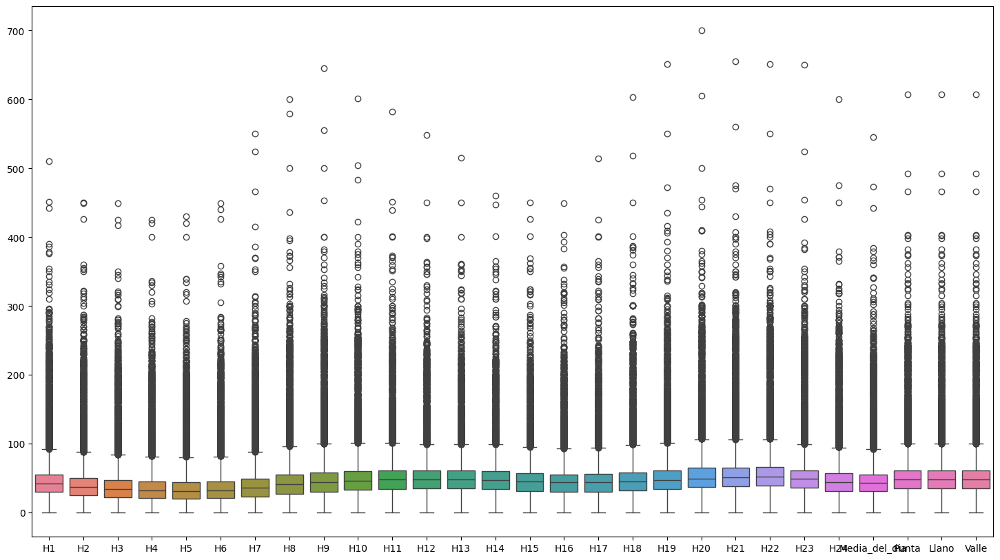

In [31]:
plt.figure(figsize=(18,10))
sns.boxplot(df)

In [32]:
df.index

DatetimeIndex(['2023-12-31', '2023-12-30', '2023-12-29', '2023-12-28',
               '2023-12-27', '2023-12-26', '2023-12-25', '2023-12-24',
               '2023-12-23', '2023-12-22',
               ...
               '1998-01-10', '1998-01-09', '1998-01-08', '1998-01-07',
               '1998-01-06', '1998-01-05', '1998-01-04', '1998-01-03',
               '1998-01-02', '1998-01-01'],
              dtype='datetime64[ns]', name='Date', length=9496, freq=None)

In [33]:

df['Año'] = df.index.year
años_únicos = df['Año'].unique()

for año in años_únicos:
    
    df_año = df[df['Año'] == año]

    fig = px.line(df_año, x=df_año.index, y='Media_del_dia',
                  title=f'Estacionalidad del mercado ibérico media diaria - Año {año}',
                  labels={'Media_del_dia': 'Valor', 'variable': 'Hora', 'Date': 'Fecha'})
    fig.update_layout(xaxis_title='Fecha', yaxis_title='Valor', legend_title='Hora', showlegend=True)
    fig.show()



# Modelado

La estacionalidad es cuando en un año (franja) se repite el mismo patron de datos. 

probar a hacer un autoarima con estacionario en false

In [34]:
asdf

NameError: name 'asdf' is not defined

In [ ]:
df

,H1,H2,H3,H4,H5,H6,H7,H8,H9,H10,...,H19,H20,H21,H22,H23,H24,Media_del_dia,Punta,Llano,Valle
Date,,,,,,,,,,,,,,,,,,,,,
2023-12-31,18.21,5.00,4.00,0.31,0.00,0.00,0.01,4.00,4.30,10.47,...,75.01,101.30,92.97,85.49,74.74,71.96,30.056250,47.94750,47.94750,47.94750
2023-12-30,86.31,82.33,78.77,70.00,62.06,59.01,76.02,79.39,86.31,88.21,...,84.00,81.50,80.00,75.00,56.85,43.23,68.405417,74.47750,74.47750,74.47750
2023-12-29,102.07,95.15,94.37,93.90,87.38,87.00,93.00,105.19,109.62,107.79,...,122.40,123.76,126.72,123.24,109.00,102.07,103.500417,111.59875,111.59875,111.59875
2023-12-28,95.62,87.99,78.56,76.20,75.18,76.46,90.78,101.11,108.37,108.45,...,117.98,121.50,128.46,122.02,112.12,100.15,98.193333,107.05500,107.05500,107.05500
2023-12-27,78.00,75.00,58.59,54.10,50.18,53.40,65.10,80.20,91.75,87.00,...,109.18,111.49,121.53,120.38,105.00,90.78,79.545000,89.94875,89.94875,89.94875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1998-01-05,37.02,13.52,13.29,13.29,13.29,13.16,13.28,13.29,18.96,19.71,...,37.35,38.77,38.34,37.98,37.98,37.98,25.960833,32.14875,32.14875,32.14875
1998-01-04,35.58,20.00,13.46,13.34,13.28,13.28,13.28,13.28,13.16,12.84,...,37.62,38.07,39.55,40.75,40.75,39.67,23.191250,24.65750,24.65750,24.65750
1998-01-03,25.33,18.93,18.33,18.33,17.71,17.43,17.43,13.52,17.43,18.78,...,22.72,22.96,23.63,23.66,22.12,22.54,19.594167,20.53625,20.53625,20.53625


In [ ]:
df.to_csv('data.csv')

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split


In [ ]:
df2 = df['Media_del_dia']

In [ ]:
df2 = df[['Media_del_dia']][0:1826]

In [ ]:
df2

,Media_del_dia
Date,
2023-12-31,30.056250
2023-12-30,68.405417
2023-12-29,103.500417
2023-12-28,98.193333
2023-12-27,79.545000
...,...
2019-01-05,65.328750
2019-01-04,66.835833
2019-01-03,64.009583


In [ ]:
df2 = df2[::-1]

In [ ]:
df2

,Media_del_dia
Date,
2019-01-01,63.454583
2019-01-02,60.540833
2019-01-03,64.009583
2019-01-04,66.835833
2019-01-05,65.328750
...,...
2023-12-27,79.545000
2023-12-28,98.193333
2023-12-29,103.500417


In [ ]:
df2.index = pd.to_datetime(df2.index)

In [ ]:
train, test = train_test_split(df2, test_size=0.2, shuffle=False)

In [ ]:
df2['valor_diff'] = df2.diff(1)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_11900\1626874713.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

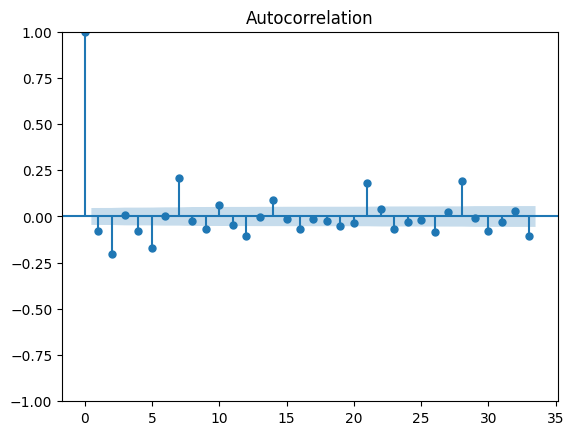

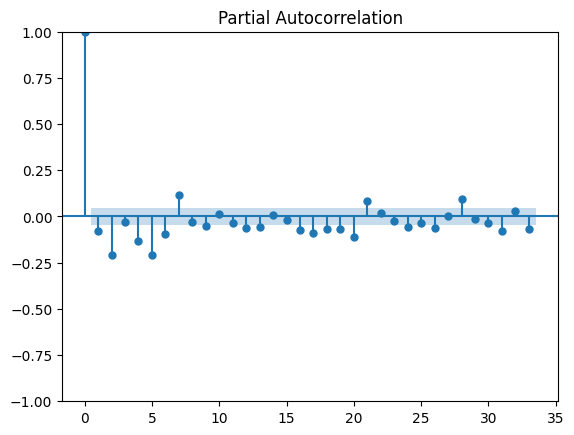

In [ ]:
plot_acf(df2['valor_diff'].dropna())
plot_pacf(df2['valor_diff'].dropna())
plt.show()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
p = 1
d = 1
q = 1
P = 1
D = 1
Q = 1
S = 365

In [ ]:
modelo_sarima = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, S))
resultado = modelo_sarima.fit()

C:\Users\Usuario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\Usuario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

C:\Users\Usuario\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\Usuario\AppData\Local\Packages\PythonSoftwareFounda

KeyboardInterrupt: 

In [ ]:
predicciones = resultado.get_forecast(steps=len(test))

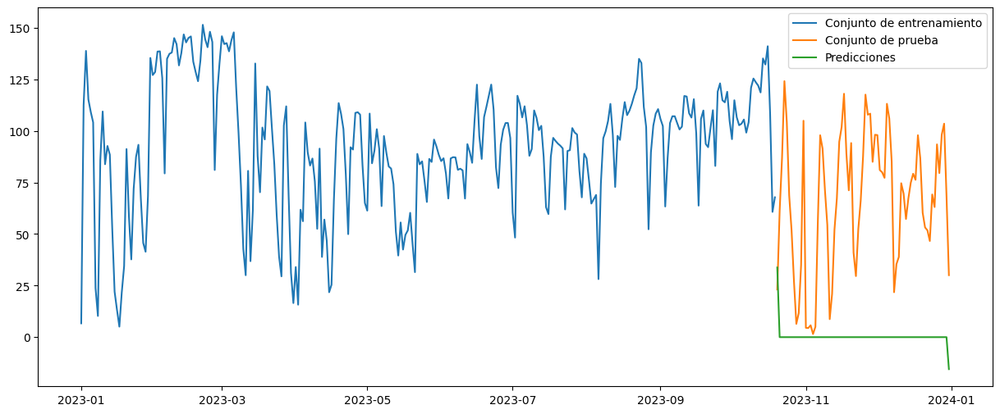

In [ ]:
indice_predicciones = predicciones.predicted_mean.index

# Visualizar las predicciones
plt.figure(figsize=(15,6))
plt.plot(train.index, train, label='Conjunto de entrenamiento')
plt.plot(test.index, test, label='Conjunto de prueba')
plt.plot(indice_predicciones, predicciones.predicted_mean, label='Predicciones')
plt.legend()
plt.show()